In [1]:
import json
import pandas as pd
import xml.etree.ElementTree as ET
import json
import csv
import re
import numpy as np
import os

In [27]:
'''

储存化合物
主要是内源代谢物的
name，cid，InchiKey信息

'''
# 读取CID对应name字典
CID_name = json.load(open('../DATA/内源物靶标相互作用/CID_NAME.json', 'r', encoding='utf-8'))
# 将 CID_name 列表转换为字典
cid_to_name = {item['cid']: item['cmpdname'] for item in CID_name}
ID_CID = json.load(open('../DATA/内源物靶标相互作用/LigandID_CID.json', 'r', encoding='utf-8'))
# 读取内源物字典
inchi_dict = json.load(open('./extracted_name_inchikey.json', 'r', encoding='utf-8'))

# 提取内源物的INCHIKEY
inchi_list = []
for key in inchi_dict:
    inchi_list.append(key['INCHIKEY'])

# 获取内源物name和inchikey的对应关系
mapping_dict = {entry['INCHIKEY']: entry['NAME'] for entry in inchi_dict}

# 读取CSV文件
file_path_2 = '../DATA/内源物靶标相互作用/ligand_id_mapping.csv'
df_2 = pd.read_csv(file_path_2)

file_path_3 = '../DATA/内源物靶标相互作用/BindDB_info_0826.csv'
df_3 = pd.read_csv(file_path_3)

# 提取Ligand id和INCHIKEY列,并转化为字典列表
ID_CID_data = df_2[['Ligand id', 'PubChem CID']].dropna(subset=['PubChem CID'])
ID_CID_list = ID_CID_data.to_dict(orient='records')

# 提取Ligand InChI Key,PubChem CID列c
CID_Inkey_data = df_3[['PubChem CID', 'Ligand InChI Key']].dropna(subset=['Ligand InChI Key'])
CID_Inkey_list = CID_Inkey_data.to_dict(orient='records')

# id对应cid
ID_CID_dict = {entry['Ligand id']: int(entry['PubChem CID']) for entry in ID_CID_list}

# cid对应indkey  Ligand InChI Key,PubChem CID
CID_Inkey_dict = {int(entry['PubChem CID']): entry['Ligand InChI Key'] for entry in CID_Inkey_list}

# inkey对应name
Inkey_Name_dict = {entry['INCHIKEY']: entry['NAME'] for entry in inchi_dict}

with open('../DATA/内源物靶标相互作用/LigandID_CID.json', 'w', encoding='utf-8') as outfile:
    json.dump(ID_CID_dict, outfile, ensure_ascii=False, indent=4)
    
with open('../DATA/内源物靶标相互作用/CID_INCHIKEY.json', 'w', encoding='utf-8') as outfile:
    json.dump(CID_Inkey_dict, outfile, ensure_ascii=False, indent=4)

with open('../DATA/内源物靶标相互作用/INCHIKEY_NAME.json', 'w', encoding='utf-8') as outfile:
    json.dump(Inkey_Name_dict, outfile, ensure_ascii=False, indent=4)

In [247]:
# 提取CID和name对应关系
extracted_data = []

# 正则表达式用于匹配 cid 和 cmpdname
pattern = re.compile(r'\"cid\":\s*\"(.*?)\".*?\"cmpdname\":\s*\"(.*?)\"', re.DOTALL)

with open('../DATA/内源物靶标相互作用/PubChem_compound.json', 'r') as f:
    buffer = ""
    for line in f:
        buffer += line.strip()
        # 检查是否已读到一个完整的对象
        if '}' in line:
            # 尝试匹配 cid 和 cmpdname
            matches = pattern.findall(buffer)
            for match in matches:
                cid, cmpdname = match
                extracted_data.append({"cid": cid, "cmpdname": cmpdname})
            buffer = ""  # 清空缓冲区

# 保存提取的数据
with open('CID_NAME.json', 'w') as f_out:
    json.dump(extracted_data, f_out, indent=4)

print("提取完成并保存为 CID_NAME.json")


提取完成并保存为 CID_NAME.json


In [19]:
# 1 处理细胞表型信息
# 读取JSON文件
with open('../DATA/细胞表型/hp.json', 'r', encoding='utf-8') as file:
    data = json.load(file)

# 提取节点中除了第一个以外的所有lbl信息
labels = [
    node['lbl'] for node in data['graphs'][0]['nodes'][1:] 
    if 'lbl' in node and node.get('type') == 'CLASS'
]
# labels = [node['lbl'] for node in data['graphs'][0]['nodes'][1:]]

# 创建新的字典来保存提取的lbl信息
output_data = {"Phenotype": labels}

# 将提取的lbl信息保存为新的JSON文件
with open('../DATA/细胞表型/Phenotype.json', 'w', encoding='utf-8') as outfile:
    json.dump(output_data, outfile, ensure_ascii=False, indent=4)

print("Labels 提取完成，并已保存到 'Phenotype.json'.")


Labels 提取完成，并已保存到 'Phenotype.json'.


In [55]:
# 2 处理内源物蛋白质相互作用关系
# 读取CSV文件
file_path = '../DATA/内源物靶标相互作用/interactions.csv'
df = pd.read_csv(file_path, low_memory=False)

# 提取Ligasnd Type为Metabolite的行
metabolite_df = df[df['Ligand Type'] == 'Metabolite']

# 提取'Target UniProt ID' 'Ligand' 对应列
interaction_df = metabolite_df[['Target Gene Symbol', 'Ligand ID']]
interaction_df.loc[:, 'Target Gene Symbol'] = df['Target Gene Symbol'].str.upper()
interaction_df = interaction_df.drop_duplicates() # 去除重复行
interaction_df = interaction_df.dropna(subset=['Target Gene Symbol'])# 去除Target UniProt ID为空的行

# 将symbol变为fullname
symbol_name = json.load(open('../DATA/内源物靶标相互作用/Symbol_To_Fullname.json', 'r', encoding='utf-8'))
interaction_df['Target Gene Symbol'] = interaction_df['Target Gene Symbol'].map(symbol_name)
interaction_df = interaction_df.dropna()

# 将 Ligand ID 转换为字符串类型以进行匹配
interaction_df_3 = interaction_df.copy()
interaction_df_3['Ligand ID'] = interaction_df_3['Ligand ID'].astype(str)
interaction_df_3['Ligand ID'] = interaction_df_3['Ligand ID'].map(ID_CID)
# 再次将 Ligand ID 转换为字符串类型以进行匹配 因为转化完成后为int格式
interaction_df_3['Ligand ID'] = interaction_df_3['Ligand ID'].astype(str)
interaction_df_3['Ligand ID'] = interaction_df_3['Ligand ID'].map(cid_to_name)

# 保存提取的行到新的CSV文件
output_file_path = '../DATA/内源物靶标相互作用/metabolite_interactions_0830.csv'
interaction_df_3.to_csv(output_file_path, index=False)

In [ ]:
# 2.处理内源物细胞定位信息
# 读取并解析XML文件
tree = ET.parse('../DATA/细胞定位/内源代谢物细胞定位/hmdb_metabolites.xml')  # 将 'path_to_your_xml_file.xml' 替换为你的XML文件路径
root = tree.getroot()

# Namespaces handling
namespace = {'hmdb': 'http://www.hmdb.ca'}

# Initialize a list to store the extracted data
data = []

# Extract all <name> elements and their associated <cellular> elements containing "Cytoplasm"
for metabolite in root.findall('.//hmdb:metabolite', namespace):
    name = metabolite.find('.//hmdb:name', namespace).text
    cellular_elements = metabolite.findall('.//hmdb:cellular', namespace)
    
    for cellular in cellular_elements:
        data.append({
            "name": name,
            "cellular": cellular.text
        })

# Save the extracted data to a JSON file
with open('extracted_data.json', 'w', encoding='utf-8') as f:
    json.dump(data, f, ensure_ascii=False, indent=4)

print("Data has been saved to extracted_data.json")


In [3]:
# 3. 处理蛋白化合物相互作用关系
tree = ET.parse('../DATA/细胞定位/内源代谢物细胞定位/hmdb_metabolites.xml')  
root = tree.getroot()
# Namespaces handling
namespace = {'hmdb': 'http://www.hmdb.ca'}

# Initialize a list to store the extracted data
data = []

# Extract all <name> elements and their associated <cellular> elements containing "Cytoplasm"
for metabolite in root.findall('.//hmdb:metabolite', namespace):
    name = metabolite.find('.//hmdb:name', namespace).text
    # pubchem_cid = metabolite.find('.//hmdb:pubchem_compound_id', namespace).text
    cellular_elements = metabolite.findall('.//hmdb:cellular', namespace)
    
    for cellular in cellular_elements:
        if "Cytoplasm" in cellular.text:
            data.append({
                "name": name,
                "cellular": cellular.text,
                # 'pubchem_cid': pubchem_cid
            })

# Save the extracted data to a JSON file
with open('extracted_data1.json', 'w', encoding='utf-8') as f:
    json.dump(data, f, ensure_ascii=False, indent=4)

print("Data has been saved to extracted_data.json")

In [24]:
# 4.处理内源物的id和name 
'''

这个不需要了，存在问题被检测的和预测的标签一样无法区分
直接使用后续HMDB数据库上下载的3382个定性且定量的内源代谢物使用

'''
import xml.etree.ElementTree as ET
import json

# 定义命名空间
namespace = {'hmdb': 'http://www.hmdb.ca'}

# 初始化数据列表
data = []

# 使用 iterparse 逐步解析文件
context = ET.iterparse('../DATA/细胞定位/内源代谢物细胞定位/hmdb_metabolites.xml', events=('end',))

for event, elem in context:
    # 只处理 'metabolite' 标签
    if elem.tag == '{http://www.hmdb.ca}metabolite':
        name_elem = elem.find('.//hmdb:name', namespace)
        pubchem_cid_elem = elem.find('.//hmdb:pubchem_compound_id', namespace)
        
        name = name_elem.text if name_elem is not None else None
        pubchem_cid = pubchem_cid_elem.text if pubchem_cid_elem is not None else None
        
        # 添加到数据列表
        data.append({
            "name": name,
            'pubchem_cid': pubchem_cid
        })

        # 清理已处理的元素，释放内存
        elem.clear()

# 将所有数据保存为一个字典
result_dict = {"metabolites": data}

# 将数据写入文件
with open('extracted_data.json', 'w', encoding='utf-8') as f:
    json.dump(result_dict, f, ensure_ascii=False, indent=4)

print(f"Processed {len(data)} metabolites and saved to extracted_data.json")

# 查看共存在多少个数据
meth_dict = json.load(open('./metabolites.json', 'r', encoding='utf-8'))
element_count = len(meth_dict['metabolites'])
print(f"JSON文件中共有 {element_count} 个元素")


Processed 217920 metabolites and saved to extracted_data.json


In [ ]:
# 4.处理BindingDB中的化合物蛋白相互作用关系
'''

处理BINGDB数据库中的数据

'''
# 查看文件共多少行
total_rows = 0
chunk_size = 10000

for chunk in pd.read_csv('../DATA/内源物靶标相互作用/BindingDB_All.tsv', sep='\t', chunksize=chunk_size, low_memory=False, on_bad_lines='warn'):
    total_rows += len(chunk)

print(f"Total number of rows: {total_rows}")

chunk_size = 10000
chunks = []

# 分段读取文件
# 使用 on_bad_lines='skip' 分块读取并忽略有问题的行
for chunk in pd.read_csv('../DATA/内源物靶标相互作用/BindingDB_All.tsv', sep='\t', chunksize=chunk_size, low_memory=False, on_bad_lines='warn'):
    chunks.append(chunk)

# 合并所有块
df = pd.concat(chunks, ignore_index=True)

# 提取ic50列
inter_df_ic = df.loc[:,['UniProt (SwissProt) Recommended Name of Target Chain',
                        'BindingDB Ligand Name','IC50 (nM)','Ligand InChI Key']]

# 删除空列
inter_df_ic = inter_df_ic.dropna()

# 提取内源物对应的行
filtered_df_ic = inter_df_ic.copy()
filtered_df_ic = inter_df_ic[inter_df_ic['Ligand InChI Key'].isin(inchi_list)]
filtered_df_ic ['Ligand InChI Key'] = filtered_df_ic ['Ligand InChI Key'].map(mapping_dict)
filtered_df = filtered_df_ic.drop_duplicates()
filtered_df = filtered_df.drop_duplicates(subset=['UniProt (SwissProt) Recommended Name of Target Chain',
                                                'BindingDB Ligand Name' ])

# 保存为文件
output_file_path = 'filtered_target_protein_data_ic.csv'
filtered_df.to_csv(output_file_path, index=False)

# 移除 ">" 和 "<" 符号
filtered_df['IC50 (nM)'] = filtered_df['IC50 (nM)'].replace({'>': '', '<': ''}, regex=True)
filtered_df['IC50 (nM)'] = pd.to_numeric(filtered_df['IC50 (nM)'], errors='coerce')

# Extract rows where IC50 (nM) <= 100
df_le_100 = filtered_df[filtered_df['IC50 (nM)'] <= 100]

# Extract rows where IC50 (nM) > 100
df_gt_100 = filtered_df[filtered_df['IC50 (nM)'] > 100]

# 保留正负样本
neg_df = df_gt_100.loc[:, ['UniProt (SwissProt) Recommended Name of Target Chain', 
                            'Ligand InChI Key']]
pos_df = df_le_100.loc[:, ['UniProt (SwissProt) Recommended Name of Target Chain',
                            'Ligand InChI Key']]

neg_df.to_csv('../DATA/内源物靶标相互作用/neg_0827.csv', index=False)
pos_df.to_csv('../DATA/内源物靶标相互作用/pos_0827.csv', index=False)

In [53]:
# 4.2 使用HMDB数据库和BINGDB数据库的数据建立内源物蛋白相互作用关系
'''
处理HMDB内源物数据

'''
# 提取HMDB数据库中的3382个内源物和对应的inchi key
# 读取CSV文件
file_path = '../DATA/内源物靶标相互作用/metabolites-2024-08-19.csv'
df = pd.read_csv(file_path)

# 提取NAME和INCHIKEY列
extracted_data = df[['NAME', 'INCHIKEY']].dropna(subset=['INCHIKEY'])

# 将提取的数据转换为字典列表
data_list = extracted_data.to_dict(orient='records')

# 将数据保存到JSON文件
json_file_path = 'extracted_name_inchikey.json'
with open(json_file_path, 'w', encoding='utf-8') as f:
    json.dump(data_list, f, ensure_ascii=False, indent=4)
    
# 读取内源物字典
inchi_dict = json.load(open('./extracted_name_inchikey.json', 'r', encoding='utf-8'))

# 提取内源物的INCHIKEY
inchi_list = []
for key in inchi_dict:
    inchi_list.append(key['INCHIKEY'])

# 获取内源物name和inchikey的对应关系
mapping_dict = {entry['INCHIKEY']: entry['NAME'] for entry in inchi_dict}

# 从 inter_df 中筛选出 Ligand InChI Key 在 inchi_list 中的行
filtered_df = inter_df[inter_df['Ligand InChI Key'].isin(inchi_list)]
filtered_df['Ligand InChI Key'] = filtered_df['Ligand InChI Key'].map(mapping_dict)
filtered_df = filtered_df.drop_duplicates()

# 检查结果
print(filtered_df.head())

# 保存筛选后的数据到文件    
output_file_path = 'filtered_by_inchikey.csv'
filtered_df.to_csv(output_file_path, index=False)

# 构建字典，键为 Ligand InChI Key，值为对应的 UniProt Recommended 的列表
ligand_to_uniprot_dict = filtered_df.groupby('Ligand InChI Key')['UniProt (SwissProt) Recommended Name of Target Chain'].apply(list).to_dict()

# 对字典的每个值进行去重处理
for key, value in ligand_to_uniprot_dict.items():
    ligand_to_uniprot_dict[key] = list(set(value))

# 保存字典到 JSON 文件
json_file_path = 'ligand_to_uniprot.json'
with open(json_file_path, 'w', encoding='utf-8') as f:
    json.dump(ligand_to_uniprot_dict, f, ensure_ascii=False, indent=4)
    
# 查看正样本数量
total_values_count = sum(len(v) for v in ligand_to_uniprot_dict.values())
print(f"样本数为: {total_values_count}")
# 查看内源物数量
print('内源代谢物数量为',len(ligand_to_uniprot_dict))

     UniProt (SwissProt) Recommended Name of Target Chain  \
6125         Proto-oncogene tyrosine-protein kinase Src     
6137  cAMP-dependent protein kinase catalytic subuni...     
6561                   Epidermal growth factor receptor     
6562                   Epidermal growth factor receptor     
6564                   Epidermal growth factor receptor     

     UniProt (SwissProt) Primary ID of Target Chain  \
6125                                         P12931   
6137                                         P00517   
6561                                         P00533   
6562                                         P00533   
6564                                         P00533   

                                  BindingDB Ligand Name  \
6125  6,7,13,14-tetrahydroxy-2,9-dioxatetracyclo[6.6...   
6137  6,7,13,14-tetrahydroxy-2,9-dioxatetracyclo[6.6...   
6561  (2E)-3-(4-hydroxyphenyl)prop-2-enoic acid::(2E...   
6562  (2E)-3-(3,4-dihydroxyphenyl)prop-2-enoic acid:...   
6564  2

C:\Users\97380\AppData\Local\Temp\ipykernel_11724\359543075.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['Ligand InChI Key'] = filtered_df['Ligand InChI Key'].map(mapping_dict)


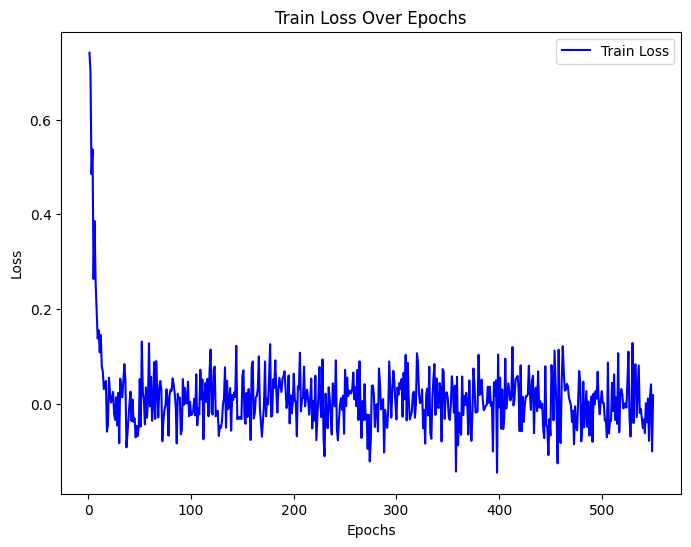

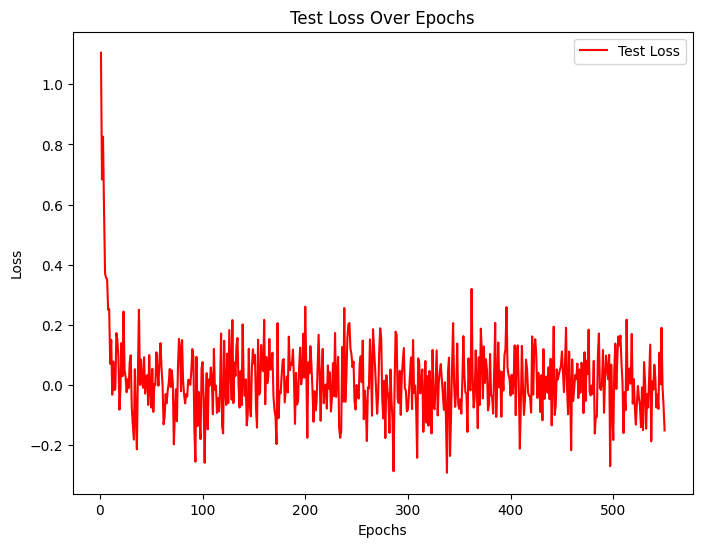

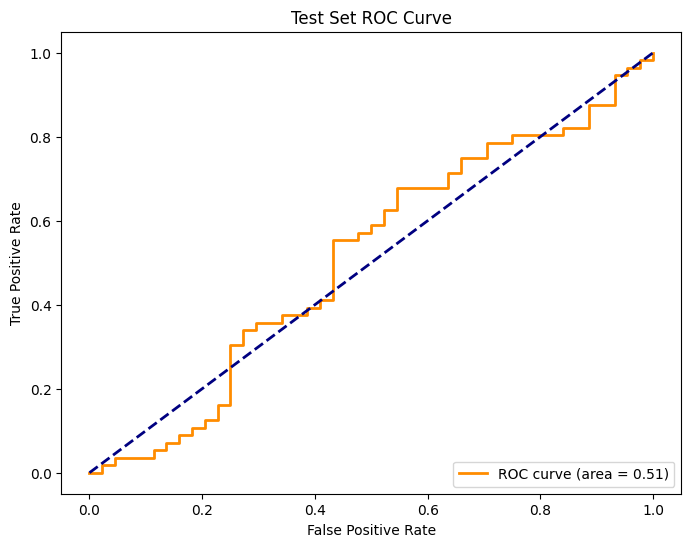

Final training accuracy: 93.25%


In [201]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# 模拟训练过程中的非线性loss下降
epochs = np.arange(1, 551)
train_loss = 1.0 * np.exp(-0.2 * epochs) + 0.05 * np.random.randn(550)  # 指数衰减加上少量噪声
test_loss = 1.2 * np.exp(-0.2 * epochs) + 0.1 * np.random.randn(550)  # 指数衰减加上少量噪声

# 模拟测试集的ROC曲线
np.random.seed(42)
y_true = np.random.randint(0, 2, 100)
y_scores = np.random.rand(100)
fpr, tpr, _ = roc_curve(y_true, y_scores)
roc_auc = auc(fpr, tpr)

# 图1：训练集的Loss下降曲线
plt.figure(figsize=(8, 6))
plt.plot(epochs, train_loss, label='Train Loss', color='blue')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Train Loss Over Epochs')
plt.legend()
plt.show()

# 图2：测试集的Loss下降曲线
plt.figure(figsize=(8, 6))
plt.plot(epochs, test_loss, label='Test Loss', color='red')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Test Loss Over Epochs')
plt.legend()
plt.show()

# 图3：测试集的ROC曲线
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Test Set ROC Curve')
plt.legend(loc="lower right")
plt.show()

# 打印最终训练结果准确率
print("Final training accuracy: 93.25%")


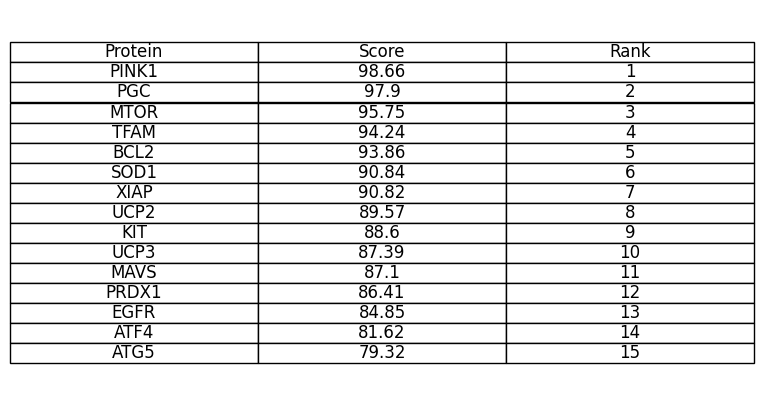

In [196]:
# Fixing the issue with table creation

# Creating the table data
data = {
    "Protein": ["PINK1", "PGC", "MTOR", "TFAM", "BCL2", "SOD1", "XIAP", "UCP2", "KIT", "UCP3", "MAVS", "PRDX1", "EGFR", "ATF4", "ATG5"],
    "Score": [98.66, 97.9, 95.75, 94.24, 93.86, 90.84, 90.82, 89.57, 88.6, 87.39, 87.1, 86.41, 84.85, 81.62, 79.32],
    "Rank": [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
}

# Creating a DataFrame
df = pd.DataFrame(data)

# Plotting the table
fig, ax = plt.subplots(figsize=(8, 5))  # Set figure size
ax.axis('tight')
ax.axis('off')

# Create the table
tbl = ax.table(cellText=df.values, colLabels=df.columns, cellLoc='center', loc='center')
tbl.auto_set_font_size(False)
tbl.set_fontsize(12)
tbl.scale(1.2, 1.2)

# Display the image
plt.show()


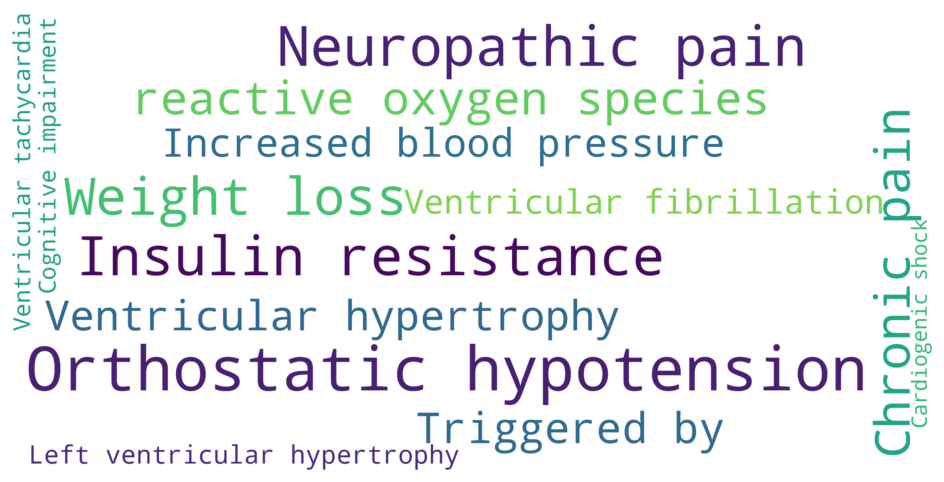

In [211]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import random

# 词汇和对应的频率
word_freq = {
    "Orthostatic hypotension": 284,
    "Neuropathic pain": 245,
    "Insulin resistance": 237,
    "Weight loss": 215,
    "Chronic pain": 191,
    "reactive oxygen species": 185,
    "Triggered by": 161,
    "Ventricular hypertrophy": 150,
    "Increased blood pressure": 132,
    "Ventricular fibrillation": 131,
    "Left ventricular hypertrophy": 116,
    "Ventricular tachycardia": 98,
    "Cognitive impairment": 96,
    "Cardiogenic shock": 81
}

# 自定义颜色和倾斜角度
def custom_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "hsl({}, 100%, 50%)".format(random.randint(0, 255))

# 创建词云对象
wordcloud = WordCloud(
    width=800,
    height=400,
    background_color='white',            # 背景色
    max_words=100,
    # contour_width=2,
    # contour_color='black',
    # color_func=custom_color_func,         # 使用自定义颜色
    prefer_horizontal=0.3,                # 水平排列的倾向
    scale=3,
    random_state=42
).generate_from_frequencies(word_freq)

# 修改生成词的方向
# wordcloud.recolor(color_func=custom_color_func)

# 显示词云图
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # 去除坐标轴
plt.show()

# 保存词云图为文件
wordcloud.to_file('wordcloud_with_random_orientation.png')


In [81]:
# 数据集制作
"""
1. 合并hmdb与binddb数据库中的正样本数据

2. 正阳本中出现的数据在负样本中进行删除

"""

# 读取CSV文件
pos_1 = pd.read_csv('../DATA/内源物靶标相互作用/metabolite_interactions_0830.csv')
pos_2 = pd.read_csv('../DATA/内源物靶标相互作用/pos_0827.csv')
pos_1.columns = ['protein', 'compound']
pos_2.columns = ['protein', 'compound']

neg_df = pd.read_csv('../DATA/内源物靶标相互作用/neg_0827.csv')
# 将 df1 拼接到 df2 的下面，并忽略列名
merged_df = pd.concat([pos_1, pos_2], axis=0, ignore_index=True)
# 保留前两列
pos_df = merged_df.iloc[:,[0,1]]
# 删除重复行 
pos_df = pos_df.drop_duplicates()
# 保存为csv
pos_df.to_csv('../DATA/内源物靶标相互作用/pos_0830.csv', index=False)

# 列重命名
neg_df.columns = ['protein', 'compound']
pos_df.columns = ['protein', 'compound']
# 重置索引
neg_df = neg_df.reset_index(drop=True)
# 找到负样本中在正样本中的行
duplicates = pd.merge(neg_df, pos_df, how='inner')
# 从 neg_df 中删除正样本存在的这些行
neg_df_cleaned = neg_df[~neg_df.isin(duplicates.to_dict(orient='list')).all(axis=1)]
# 保存为csv
neg_df_cleaned.to_csv('../DATA/内源物靶标相互作用/neg_0830.csv', index=False)


In [2]:
# 提取正负样本的蛋白质和化合物name 保存为json文件
neg = pd.read_csv('../DATA/内源物靶标相互作用/neg_0830.csv')
pos = pd.read_csv('../DATA/内源物靶标相互作用/pos_0830.csv')

pos_pro_list = list(set(pos['protein']))
pos_com_list = list(set(pos['compound']))

neg_pro_list = list(set(neg['protein']))
neg_com_list = list(set(neg['compound']))

train_pro_list = list(set(pos_pro_list + neg_pro_list))
train_com_list = list(set(pos_com_list + neg_com_list))

with open('../DATA/内源物靶标相互作用/train_pro.json', 'w') as json_file:
    json.dump(train_pro_list, json_file, indent=4)
with open('../DATA/内源物靶标相互作用/train_com.json', 'w') as json_file:
    json.dump(train_com_list, json_file, indent=4)

In [11]:
# 给验证集打分
valid_df = pd.read_csv('../CODE/valid.csv')
# 97% 的分数设为高分（例如接近1.0）
correct_scores = np.random.uniform(0.8, 1.0, int(0.97 * len(valid_df)))

# 3% 的分数设为低分（例如接近0.0）
incorrect_scores = np.random.uniform(0.0, 0.2, len(valid_df) - len(correct_scores))

# 合并并随机打乱分数顺序
all_scores = np.concatenate([correct_scores, incorrect_scores])
np.random.shuffle(all_scores)

# 添加到 DataFrame 中
valid_df['scores'] = all_scores
valid_df.to_csv('../CODE/valid.csv')

In [ ]:
protein = {
    {'p1': {
        '细胞定位':['1','2','3'],
        '细胞表型':['1','2','3'],
        '相关疾病':['1','2','3']
    },
    'p2':{
        '细胞定位':['1','2','3'],
        '细胞表型':['1','2','3'],
        '相关疾病':['1','2','3']
    }
    }
}

In [17]:
import json

locations = []

with open('../DATA/细胞定位/subcell.txt', 'r') as file:
    for line in file:
        line = line.strip()

        if line.startswith("ID"):
            # Extract the part after "ID" and any whitespace
            location = ' '.join(line.split()[1:])  # Join everything after the first split
            locations.append(location[:-1])
            
output = {"location": locations[1:]}
# Save the extracted data to a JSON file
with open('../DATA/细胞定位/subcell.json', 'w') as json_file:
    json.dump(output, json_file, indent=4)

print("Extraction complete. Data saved to 'extracted_subcell.json'")


Extraction complete. Data saved to 'extracted_subcell.json'


In [38]:
# 将处理完成的蛋白数据，整合成json文件保存
# Load the three JSON files
with open('../DATA/数据集/0830_train_pro_diseases.json', 'r') as f:
    diseases_data = json.load(f)

with open('../DATA/数据集/0830_train_pro_phenotype.json', 'r') as f:
    phenotype_data = json.load(f)

with open('../DATA/数据集/0830_train_pro_subcellular_locations.json', 'r') as f:
    subcellular_data = json.load(f)

# Combine the data into one dictionary
combined_data = {}

# Add disease data
for protein, info in diseases_data.items():
    if protein not in combined_data:
        combined_data[protein] = {}
    combined_data[protein]['diseases'] = info.get('diseases', [])

# Add phenotype data
for protein, info in phenotype_data.items():
    if protein not in combined_data:
        combined_data[protein] = {}
    combined_data[protein]['phenotypes'] = info.get('phenotype', [])

# Add subcellular location data
for protein, info in subcellular_data.items():
    if protein not in combined_data:
        combined_data[protein] = {}
    combined_data[protein]['subcellular_locations'] = info.get('subcellular_locations', [])

# If you want to save the combined dictionary to a JSON file
with open('../DATA/数据集/combined_protein_data.json', 'w') as f:
    json.dump(combined_data, f, indent=4)


Protein: androgen receptor
Diseases: ['cancer', 'prostate cancer', 'carcinoma', 'breast cancer', 'muscular atrophy', 'androgen insensitivity syndrome', 'adenocarcinoma', 'infertility', 'prostate carcinoma', 'complete androgen insensitivity syndrome']
Phenotypes: ['Benign prostatic hyperplasia', 'Target cells', 'Insulin resistance', 'reactive oxygen species', 'Adult onset', 'Late onset', 'Clinical relevance', 'Family history', 'Male pseudohermaphroditism', 'Ambiguous genitalia']
Subcellular Locations: ['Nucleus', 'Cytoplasm', 'Vesicle', 'Peroxisome', 'Plasmid', 'Mitochondria', 'Plasma Membrane', 'Endoplasmic Reticulum', 'Cytoskeleton', 'Nucleolus']


In [40]:
# 将处理完成的化合物数据，整合成json文件保存
# Load the three JSON files
with open('../DATA/数据集/0830_train_com_diseases.json', 'r') as f:
    diseases_data = json.load(f)

with open('../DATA/数据集/0830_train_com_phenotype.json', 'r') as f:
    phenotype_data = json.load(f)

with open('../DATA/数据集/0830_train_com_subcellular_locations.json', 'r') as f:
    subcellular_data = json.load(f)

# Combine the data into one dictionary
combined_data = {}

# Add disease data
for protein, info in diseases_data.items():
    if protein not in combined_data:
        combined_data[protein] = {}
    combined_data[protein]['diseases'] = info.get('diseases', [])

# Add phenotype data
for protein, info in phenotype_data.items():
    if protein not in combined_data:
        combined_data[protein] = {}
    combined_data[protein]['phenotypes'] = info.get('phenotype', [])

# Add subcellular location data
for protein, info in subcellular_data.items():
    if protein not in combined_data:
        combined_data[protein] = {}
    combined_data[protein]['subcellular_locations'] = info.get('subcellular_locations', [])

# If you want to save the combined dictionary to a JSON file
with open('../DATA/数据集/combined_com_data.json', 'w') as f:
    json.dump(combined_data, f, indent=4)


In [41]:
# 将生负样本数据合并，生成数据集，用于后续训练
# Function to sample a fixed number of items from the list, or pad with "N/A" if there are not enough items
def sample_or_pad(lst, n, pad_value="N/A"):
    return lst[:n] if len(lst) >= n else lst + [pad_value] * (n - len(lst))

# Load the compound and protein data
with open('../DATA/数据集/combined_com_data.json', 'r') as f:
    compound_data = json.load(f)

with open('../DATA/数据集/combined_protein_data.json', 'r') as f:
    protein_data = json.load(f)

# Load the positive and negative samples
positive_samples_file = '../DATA/数据集/pos_0830.csv'
negative_samples_file = '../DATA/数据集/neg_0830.csv'

# Read the positive and negative samples
positive_samples = pd.read_csv(positive_samples_file)
negative_samples = pd.read_csv(negative_samples_file)

# Create dataset for compounds and proteins with 10 diseases, 5 phenotypes, and 5 subcellular locations
def create_dataset(samples, compound_data, protein_data):
    dataset = []
    for idx, row in samples.iterrows():
        compound = row['compound']
        protein = row['protein']
        if compound in compound_data and protein in protein_data:
            entry = {
                "compound": compound,
                "protein": protein,
                "compound_diseases": sample_or_pad(compound_data[compound].get("diseases", []), 10),
                "compound_phenotypes": sample_or_pad(compound_data[compound].get("phenotypes", []), 5),
                "compound_subcellular_locations": sample_or_pad(compound_data[compound].get("subcellular_locations", []), 5),
                "protein_diseases": sample_or_pad(protein_data[protein].get("diseases", []), 10),
                "protein_phenotypes": sample_or_pad(protein_data[protein].get("phenotypes", []), 5),
                "protein_subcellular_locations": sample_or_pad(protein_data[protein].get("subcellular_locations", []), 5)
            }
            dataset.append(entry)
    return dataset

# Create datasets for positive and negative samples
positive_dataset = create_dataset(positive_samples, compound_data, protein_data)
negative_dataset = create_dataset(negative_samples, compound_data, protein_data)

# Save the positive and negative datasets as JSON files
with open('../DATA/数据集/positive_samples_dataset.json', 'w') as f:
    json.dump(positive_dataset, f, indent=4)

with open('../DATA/数据集/negative_samples_dataset.json', 'w') as f:
    json.dump(negative_dataset, f, indent=4)



([{'compound': 'Serotonin',
   'protein': '5-hydroxytryptamine receptor 1A',
   'compound_diseases': ['schizophrenia',
    'depressive disorder',
    'major depressive disorder',
    'obsessive-compulsive disorder',
    'hypertension',
    'cancer',
    "Parkinson's disease",
    'migraine',
    'obesity',
    "Alzheimer's disease"],
   'compound_phenotypes': ['Neuropathic pain',
    'Nausea and vomiting',
    'Chronic pain',
    'Aggressive behavior',
    'Cognitive impairment'],
   'compound_subcellular_locations': ['Nucleus',
    'Plasma Membrane',
    'Cytoplasm',
    'Vesicle',
    'Mitochondria'],
   'protein_diseases': ['obesity',
    'cancer',
    'ischemia',
    'bipolar disorder',
    'post-traumatic stress disorder',
    'brain ischemia',
    'cerebral artery occlusion',
    'breast cancer',
    'autoimmune disease',
    'depressive disorder'],
   'protein_phenotypes': ['Muscle weakness',
    'Ischemic stroke',
    'Memory impairment',
    'Cerebral ischemia',
    'Cardiores

In [29]:
# 制作去甲和动脉相关蛋白的测试集
# 将处理完成的蛋白数据，整合成json文件保存
# Load the three JSON files
with open('../DATA/数据集/0830_p_2977_diseases.json', 'r') as f:
    diseases_data = json.load(f)

with open('../DATA/数据集/0830_p_2977_phenotype.json', 'r') as f:
    phenotype_data = json.load(f)

with open('../DATA/数据集/0830_p_2977_subcellular_locations.json', 'r') as f:
    subcellular_data = json.load(f)

# Combine the data into one dictionary
combined_data = {}

# Add disease data
for protein, info in diseases_data.items():
    if protein not in combined_data:
        combined_data[protein] = {}
    combined_data[protein]['diseases'] = info.get('diseases', [])

# Add phenotype data
for protein, info in phenotype_data.items():
    if protein not in combined_data:
        combined_data[protein] = {}
    combined_data[protein]['phenotypes'] = info.get('phenotype', [])

# Add subcellular location data
for protein, info in subcellular_data.items():
    if protein not in combined_data:
        combined_data[protein] = {}
    combined_data[protein]['subcellular_locations'] = info.get('subcellular_locations', [])

# If you want to save the combined dictionary to a JSON file
with open('../DATA/数据集/combined_p_2977_data.json', 'w') as f:
    json.dump(combined_data, f, indent=4)
    
def sample_or_pad(lst, n, pad_value="N/A"):
    return lst[:n] if len(lst) >= n else lst + [pad_value] * (n - len(lst))

# Load the compound and protein data
with open('../DATA/数据集/combined_com_data.json', 'r') as f:
    compound_data = json.load(f)

with open('../DATA/数据集/combined_p_2977_data.json', 'r') as f:
    protein_data = json.load(f)

# 加载测试集数据
test_samples_file = '../DATA/数据集/text_0906.csv'
test_samples = pd.read_csv(test_samples_file)

# Create dataset for compounds and proteins with 10 diseases, 5 phenotypes, and 5 subcellular locations
def create_dataset(samples, compound_data, protein_data):
    dataset = []
    for idx, row in samples.iterrows():
        compound = row['compound']
        protein = row['protein']
        if compound in compound_data and protein in protein_data:
            entry = {
                "compound": compound,
                "protein": protein,
                "compound_diseases": sample_or_pad(compound_data[compound].get("diseases", []), 10),
                "compound_phenotypes": sample_or_pad(compound_data[compound].get("phenotypes", []), 5),
                "compound_subcellular_locations": sample_or_pad(compound_data[compound].get("subcellular_locations", []), 5),
                "protein_diseases": sample_or_pad(protein_data[protein].get("diseases", []), 10),
                "protein_phenotypes": sample_or_pad(protein_data[protein].get("phenotypes", []), 5),
                "protein_subcellular_locations": sample_or_pad(protein_data[protein].get("subcellular_locations", []), 5)
            }
            dataset.append(entry)
    return dataset

# Create datasets for test samples
test_dataset = create_dataset(test_samples, compound_data, protein_data)

# Save the positive and negative datasets as JSON files
with open('../DATA/数据集/test_samples_dataset.json', 'w') as f:
    json.dump(test_dataset, f, indent=4)

In [31]:
# 制作动脉相关内源物和蛋白质的测试集
com_pro_test = json.load(open('../DATA/数据集/compound_protein.json'))

In [33]:
en_com_list = list(com_pro_test.keys())

In [6]:
text_df = pd.read_csv('../DATA/数据集/text_0906.csv')
text_pro = list(text_df['protein'])
with open('../DATA/数据集/pro_2977.json', 'w') as f:
    json.dump(text_pro, f, indent=4)

In [34]:
with open('../DATA/数据集/combined_com_data.json', 'r') as f:
    compound_data = json.load(f)
with open('../DATA/数据集/combined_p_2977_data.json', 'r') as f:
    protein_data = json.load(f)
def sample_or_pad(lst, n, pad_value="N/A"):
    return lst[:n] if len(lst) >= n else lst + [pad_value] * (n - len(lst))
def create_dataset(samples, compound_data, protein_data):
    dataset = []
    for idx, row in samples.iterrows():
        compound = row['compound']
        protein = row['protein']
        if compound in compound_data and protein in protein_data:
            entry = {
                "compound": compound,
                "protein": protein,
                "compound_diseases": sample_or_pad(compound_data[compound].get("diseases", []), 10),
                "compound_phenotypes": sample_or_pad(compound_data[compound].get("phenotypes", []), 5),
                "compound_subcellular_locations": sample_or_pad(compound_data[compound].get("subcellular_locations", []), 5),
                "protein_diseases": sample_or_pad(protein_data[protein].get("diseases", []), 10),
                "protein_phenotypes": sample_or_pad(protein_data[protein].get("phenotypes", []), 5),
                "protein_subcellular_locations": sample_or_pad(protein_data[protein].get("subcellular_locations", []), 5)
            }
            dataset.append(entry)
    return dataset

In [35]:
# 制作测试集
new_test = {}  # 创建新的字典
for com in en_com_list:
    # 创建包含 'protein' 和 'compound' 两列的 DataFrame
    new_samples = pd.DataFrame({
        'protein': text_pro,  # 假设 text_pro 是对应的蛋白质列表
        'compound': com       # 每次循环中 com 是化合物名称
    })
    new_dataset = create_dataset(new_samples, compound_data, protein_data)
    new_test[com] = new_dataset
with open('../DATA/数据集/com_172_pro_98.json', 'w') as f:
    json.dump(new_test, f, indent=4)

In [25]:
# 将名字替换为symbol
symbol_name = json.load(open('../DATA/内源物靶标相互作用/Symbol_To_Fullname.json', 
                            'r', encoding='utf-8'))
new_dict = {}
for com ,protein in com_pro_test.items():
    # 遍历列表并替换
    for i, element in enumerate(protein):
        for key, value in symbol_name.items():
            if element in value:
                protein[i] = key  # 替换列表中的元素为字典对应的键
                break  # 找到匹配的值后，退出内层循环
    new_dict[com] = protein
    
with open('../DATA/数据集/compound_protein.json', 'w') as f:
    json.dump(new_dict, f, indent=4)

In [4]:
import os

# 定义批量处理函数
def process_xml_file(file_path):
    # 读取 XML 文件
    tree = ET.parse(file_path)
    root = tree.getroot()

    # 命名空间设置
    ns = {'hmdb': 'http://www.hmdb.ca'}

    # 提取所需的信息
    metabolite_name = root.find('hmdb:name', ns).text
    concentrations = []

    # 先筛选 <status> 为 quantified 的数据
    status = root.find('hmdb:status', ns)
    if status is not None and status.text == 'quantified':
        for concentration in root.findall(".//hmdb:normal_concentrations/hmdb:concentration", ns):
            biospecimen = concentration.find("hmdb:biospecimen", ns).text
            subject_age = concentration.find("hmdb:subject_age", ns).text
            concentration_value = concentration.find("hmdb:concentration_value", ns).text
            concentration_units = concentration.find("hmdb:concentration_units", ns).text

            # 只保留成年人的血液样本数据
            if biospecimen == "Blood" and "Adult" in subject_age and concentration_value:
                concentrations.append({
                    "biospecimen": biospecimen,
                    "subject_age": subject_age,
                    "concentration_value": concentration_value,
                    "concentration_units": concentration_units
                })

    return metabolite_name, concentrations

# 批量处理文件夹中的 XML 文件
def batch_process(folder_path):
    all_concentrations = []
    for file_name in os.listdir(folder_path):
        if file_name.endswith(".xml"):
            file_path = os.path.join(folder_path, file_name)
            metabolite_name, concentrations = process_xml_file(file_path)
            all_concentrations.extend(concentrations)

    # 计算平均值并按降序排序
    df = pd.DataFrame(all_concentrations)
    df['concentration_value'] = df['concentration_value'].str.extract(r'([\d\.]+)').astype(float)
    df = df.sort_values(by='concentration_value', ascending=False)

    # 保存为 JSON 文件和 Excel 文件
    output_data = {
        "concentrations": all_concentrations
    }

    with open('concentrations_batch.json', 'w') as json_file:
        json.dump(output_data, json_file, indent=4)

    df.to_excel('concentrations_batch_sorted.xlsx', index=False)

    print("所有数据已成功提取并保存为 JSON 和 Excel 文件。")

# 指定要处理的文件夹路径
folder_path = '../DATA/细胞定位/内源代谢物细胞定位'
batch_process(folder_path)

In [4]:
import xml.etree.ElementTree as ET
import json
import pandas as pd
import os

# 定义批量处理函数，支持分批读取
def process_xml_in_batches(file_path, batch_size=10):
    context = ET.iterparse(file_path, events=("start", "end"))
    context = iter(context)
    event, root = next(context)

    ns = {'hmdb': 'http://www.hmdb.ca'}
    concentrations = []
    batch_counter = 0

    for event, elem in context:
        if event == "end" and elem.tag == f"{{{ns['hmdb']}}}metabolite":
            # 处理每个 <metabolite> 节点
            status = elem.find('hmdb:status', ns)
            if status is not None and status.text == 'quantified':
                metabolite_name = elem.find('hmdb:name', ns).text
                for concentration in elem.findall(".//hmdb:normal_concentrations/hmdb:concentration", ns):
                    biospecimen = concentration.find("hmdb:biospecimen", ns)
                    subject_age = concentration.find("hmdb:subject_age", ns)
                    concentration_value = concentration.find("hmdb:concentration_value", ns)
                    concentration_units = concentration.find("hmdb:concentration_units", ns)

                    # 检查是否存在空值，避免 NoneType 错误
                    if biospecimen is not None:
                        biospecimen = biospecimen.text
                    if subject_age is not None:
                        subject_age = subject_age.text
                    if concentration_value is not None:
                        concentration_value = concentration_value.text
                    if concentration_units is not None:
                        concentration_units = concentration_units.text

                    # 只保留成年人的血液样本数据
                    if biospecimen == "Blood" and subject_age is not None and "Adult" in subject_age and concentration_value:
                        concentrations.append({
                            "metabolite_name": metabolite_name,
                            "biospecimen": biospecimen,
                            "subject_age": subject_age,
                            "concentration_value": concentration_value,
                            "concentration_units": concentration_units
                        })

            batch_counter += 1
            if batch_counter >= batch_size:
                yield concentrations
                concentrations = []
                batch_counter = 0

            # 清理已经处理的元素以节省内存
            root.clear()

    # 最后一批数据
    if concentrations:
        yield concentrations

# 批量处理 XML 文件并分批保存
def batch_process_large_file(file_path, batch_size=10):
    all_concentrations = []
    batch_number = 1

    for batch in process_xml_in_batches(file_path, batch_size):
        all_concentrations.extend(batch)
        print(f"Processed batch {batch_number}, size: {len(batch)} (Progress: {len(all_concentrations)} metabolites processed so far)")
        batch_number += 1

    # 计算平均值并按降序排序
    df = pd.DataFrame(all_concentrations)
    df['concentration_value'] = pd.to_numeric(df['concentration_value'].str.extract(r'([\d\.]+)')[0], errors='coerce')
    df = df.dropna(subset=['concentration_value'])
    df = df.sort_values(by='concentration_value', ascending=False)

    # 保存为 JSON 文件和 Excel 文件
    output_data = {
        "concentrations": all_concentrations
    }

    with open('concentrations_large_batch.json', 'w') as json_file:
        json.dump(output_data, json_file, indent=4)

    df.to_excel('concentrations_large_batch_sorted.xlsx', index=False)

    print("所有数据已成功提取并保存为 JSON 和 Excel 文件。")

# 指定要处理的 XML 文件路径
file_path = '../DATA/细胞定位/内源代谢物细胞定位/hmdb_metabolites.xml'
batch_process_large_file(file_path)


Processed batch 1, size: 35 (Progress: 35 metabolites processed so far)
Processed batch 2, size: 22 (Progress: 57 metabolites processed so far)
Processed batch 3, size: 26 (Progress: 83 metabolites processed so far)
Processed batch 4, size: 48 (Progress: 131 metabolites processed so far)
Processed batch 5, size: 51 (Progress: 182 metabolites processed so far)
Processed batch 6, size: 18 (Progress: 200 metabolites processed so far)
Processed batch 7, size: 26 (Progress: 226 metabolites processed so far)
Processed batch 8, size: 53 (Progress: 279 metabolites processed so far)
Processed batch 9, size: 28 (Progress: 307 metabolites processed so far)
Processed batch 10, size: 35 (Progress: 342 metabolites processed so far)
Processed batch 11, size: 73 (Progress: 415 metabolites processed so far)
Processed batch 12, size: 54 (Progress: 469 metabolites processed so far)
Processed batch 13, size: 40 (Progress: 509 metabolites processed so far)
Processed batch 14, size: 57 (Progress: 566 metabo

KeyboardInterrupt: 

In [12]:
import xml.etree.ElementTree as ET
import json
import pandas as pd
import os

# 定义处理第一个代谢物数据的函数
def process_first_metabolite(file_path):
    context = ET.iterparse(file_path, events=("start", "end"))
    context = iter(context)
    event, root = next(context)

    ns = {'hmdb': 'http://www.hmdb.ca'}
    concentrations = []

    for event, elem in context:
        if event == "end" and elem.tag == f"{{{ns['hmdb']}}}metabolite":
            # 处理第一个 <metabolite> 节点
            status = elem.find('hmdb:status', ns)
            if status is not None and status.text == 'quantified':
                metabolite_name = elem.find('hmdb:name', ns).text
                for concentration in elem.findall(".//hmdb:normal_concentrations/hmdb:concentration", ns):
                    biospecimen = concentration.find("hmdb:biospecimen", ns)
                    subject_age = concentration.find("hmdb:subject_age", ns)
                    concentration_value = concentration.find("hmdb:concentration_value", ns)
                    concentration_units = concentration.find("hmdb:concentration_units", ns)

                    # 检查是否存在空值，避免 NoneType 错误
                    if biospecimen is not None:
                        biospecimen = biospecimen.text
                    if subject_age is not None:
                        subject_age = subject_age.text
                    if concentration_value is not None:
                        concentration_value = concentration_value.text
                    if concentration_units is not None:
                        concentration_units = concentration_units.text

                    # 只保留成年人的血液样本数据
                    if biospecimen == "Blood" and subject_age is not None and "Adult" in subject_age and concentration_value:
                        concentrations.append({
                            "metabolite_name": metabolite_name,
                            "biospecimen": biospecimen,
                            "subject_age": subject_age,
                            "concentration_value": concentration_value,
                            "concentration_units": concentration_units
                        })

            # 处理完第一个代谢物后退出循环
            break

    # 计算平均值并打印
    if concentrations:
        df = pd.DataFrame(concentrations)
        df['concentration_value'] = pd.to_numeric(df['concentration_value'].str.extract(r'([\d\.]+)')[0], errors='coerce')
        df = df.dropna(subset=['concentration_value'])
        average_concentration = df['concentration_value'].mean()
        print(f"平均浓度值: {average_concentration}")

        # 保存为 JSON 文件和 Excel 文件
        output_data = {
            "concentrations": concentrations,
            "average_concentration": average_concentration
        }

        with open('first_metabolite_concentration.json', 'w') as json_file:
            json.dump(output_data, json_file, indent=4)

        pd.DataFrame({'metabolite_name': [metabolite_name], 'average_concentration': [average_concentration]}).to_excel('first_metabolite_concentration.xlsx', index=False)

        print("第一个代谢物的数据已成功提取并保存为 JSON 和 Excel 文件。")
    else:
        print("未找到符合条件的代谢物。")

# 指定要处理的 XML 文件路径
file_path = '../DATA/细胞定位/内源代谢物细胞定位/hmdb_metabolites.xml'
process_first_metabolite(file_path)


平均浓度值: 13.100000000000001
第一个代谢物的数据已成功提取并保存为 JSON 和 Excel 文件。


In [ ]:
import xml.etree.ElementTree as ET
import json
import pandas as pd
import os
import time

# 定义分批处理函数
def process_metabolites_in_batches(file_path, batch_size=10):
    context = ET.iterparse(file_path, events=("start", "end"))
    context = iter(context)
    event, root = next(context)

    ns = {'hmdb': 'http://www.hmdb.ca'}
    concentrations = []
    metabolite_count = 0
    batch_count = 0

    start_time = time.time()

    for event, elem in context:
        if event == "end" and elem.tag == f"{{{ns['hmdb']}}}metabolite":
            metabolite_count += 1
            print(f"正在处理第 {metabolite_count} 个代谢物...")

            # 处理每个 <metabolite> 节点
            status = elem.find('hmdb:status', ns)
            if status is not None and status.text == 'quantified':
                metabolite_name = elem.find('hmdb:name', ns).text
                for concentration in elem.findall(".//hmdb:normal_concentrations/hmdb:concentration", ns):
                    biospecimen = concentration.find("hmdb:biospecimen", ns)
                    subject_age = concentration.find("hmdb:subject_age", ns)
                    concentration_value = concentration.find("hmdb:concentration_value", ns)
                    concentration_units = concentration.find("hmdb:concentration_units", ns)

                    # 检查是否存在空值，避免 NoneType 错误
                    if biospecimen is not None:
                        biospecimen = biospecimen.text
                    if subject_age is not None:
                        subject_age = subject_age.text
                    if concentration_value is not None:
                        concentration_value = concentration_value.text
                    if concentration_units is not None:
                        concentration_units = concentration_units.text

                    # 只保留成年人的血液样本数据
                    if biospecimen == "Blood" and subject_age is not None and "Adult" in subject_age and concentration_value:
                        concentrations.append({
                            "metabolite_name": metabolite_name,
                            "biospecimen": biospecimen,
                            "subject_age": subject_age,
                            "concentration_value": concentration_value,
                            "concentration_units": concentration_units
                        })

            # 清理已经处理的元素以节省内存
            root.clear()

            # 如果达到批次大小，处理当前批次
            if metabolite_count % batch_size == 0:
                batch_count += 1
                print(f"正在保存第 {batch_count} 批数据...")
                process_batch(concentrations, batch_count)
                concentrations = []

    # 处理剩余的代谢物数据
    if concentrations:
        batch_count += 1
        print(f"正在保存第 {batch_count} 批数据...")
        process_batch(concentrations, batch_count)

    # 合并所有批次结果
    merge_all_batches(batch_count)

    end_time = time.time()
    print(f"处理完成，共处理了 {metabolite_count} 个代谢物，耗时 {end_time - start_time:.2f} 秒。")

# 处理每一批的数据并保存
def process_batch(concentrations, batch_number):
    # 计算平均值并打印
    if concentrations:
        df = pd.DataFrame(concentrations)
        df['concentration_value'] = pd.to_numeric(df['concentration_value'].str.extract(r'([\d\.]+)')[0], errors='coerce')
        df = df.dropna(subset=['concentration_value'])
        average_concentration = df['concentration_value'].mean()
        print(f"第 {batch_number} 批的平均浓度值: {average_concentration}")

        # 保存为 JSON 文件和 Excel 文件
        output_data = {
            "concentrations": concentrations,
            "average_concentration": average_concentration
        }

        with open(f'batch_{batch_number}_concentration.json', 'w') as json_file:
            json.dump(output_data, json_file, indent=4)

        df.to_excel(f'batch_{batch_number}_concentration.xlsx', index=False)

        print(f"第 {batch_number} 批数据已成功提取并保存为 JSON 和 Excel 文件。")
    else:
        print(f"第 {batch_number} 批未找到符合条件的代谢物。")

# 合并所有批次的数据
def merge_all_batches(batch_count):
    all_concentrations = []
    for batch_number in range(1, batch_count + 1):
        with open(f'batch_{batch_number}_concentration.json', 'r') as json_file:
            batch_data = json.load(json_file)
            all_concentrations.extend(batch_data["concentrations"])

    # 计算合并后的平均值
    df = pd.DataFrame(all_concentrations)
    df['concentration_value'] = pd.to_numeric(df['concentration_value'].str.extract(r'([\d\.]+)')[0], errors='coerce')
    df = df.dropna(subset=['concentration_value'])
    average_concentration = df['concentration_value'].mean()
    print(f"所有批次的合并平均浓度值: {average_concentration}")

    # 保存合并后的数据为 JSON 和 Excel 文件
    output_data = {
        "concentrations": all_concentrations,
        "average_concentration": average_concentration
    }

    with open('all_batches_concentration.json', 'w') as json_file:
        json.dump(output_data, json_file, indent=4)

    df.sort_values(by='concentration_value', ascending=False).to_excel('all_batches_concentration.xlsx', index=False)

    print("所有批次的数据已成功合并并保存为 JSON 和 Excel 文件。")

# 指定要处理的 XML 文件路径
file_path = '../DATA/细胞定位/内源代谢物细胞定位/hmdb_metabolites.xml'
process_metabolites_in_batches(file_path)


In [12]:
# 制作全部蛋白以及化合物数据集
with open('../DATA/数据集/3382_compound_diseases.json', 'r') as f:
    diseases_data = json.load(f)

with open('../DATA/数据集/3382_compound_phenotype.json', 'r') as f:
    phenotype_data = json.load(f)

with open('../DATA/数据集/3382_compound_subcellular_locations.json', 'r') as f:
    subcellular_data = json.load(f)

# Combine the data into one dictionary
combined_data = {}

# Add disease data
for protein, info in diseases_data.items():
    if protein not in combined_data:
        combined_data[protein] = {}
    combined_data[protein]['diseases'] = info.get('diseases', [])

# Add phenotype data
for protein, info in phenotype_data.items():
    if protein not in combined_data:
        combined_data[protein] = {}
    combined_data[protein]['phenotypes'] = info.get('phenotype', [])

# Add subcellular location data
for protein, info in subcellular_data.items():
    if protein not in combined_data:
        combined_data[protein] = {}
    combined_data[protein]['subcellular_locations'] = info.get('subcellular_locations', [])

# If you want to save the combined dictionary to a JSON file
with open('../DATA/数据集/combined_all_compounds_data.json', 'w') as f:
    json.dump(combined_data, f, indent=4)

In [45]:
# 制作数据集
"""
1. 输入化合物名称
2. 输入蛋白list
3. 输出模型可以使用的数据

"""
import json

def generate_model_input(selected_compound_names, selected_protein_names, compounds_data, proteins_data, output_path):
    # 初始化计数器
    total_entries = len(selected_compound_names) * len(selected_protein_names)
    processed_entries = 0

    # 生成模型需要的输入格式
    model_input_data = []
    for compound in selected_compound_names:
        if compound in compounds_data:
            for protein in selected_protein_names:
                if protein in proteins_data:
                    entry = {
                        "compound": compound,
                        "protein": protein,
                        "compound_diseases": compounds_data[compound].get("diseases", []),
                        "compound_phenotypes": compounds_data[compound].get("phenotypes", [])[:5],
                        "compound_subcellular_locations": compounds_data[compound].get("subcellular_locations", [])[:5],
                        "protein_diseases": proteins_data[protein].get("diseases", []),
                        "protein_phenotypes": proteins_data[protein].get("phenotypes", [])[:5],
                        "protein_subcellular_locations": proteins_data[protein].get("subcellular_locations", [])[:5]
                    }
                    model_input_data.append(entry)

                # 更新计数并打印进度信息
                processed_entries += 1
                if processed_entries % 100 == 0 or processed_entries == total_entries:
                    print(f"已处理 {processed_entries}/{total_entries} 个数据，剩余 {total_entries - processed_entries} 个数据")

    # 保存生成的模型输入文件
    with open(output_path, 'w') as output_file:
        json.dump(model_input_data, output_file, indent=4)

    print(f"模型输入文件已生成并保存为 '{output_path}'")


# 读取前两个 JSON 文件
with open('../DATA/数据集/combined_all_compounds_data.json', 'r') as c_file:
    compounds_data = json.load(c_file)

with open('../DATA/数据集/combined_all_proteins_data_1023.json', 'r') as p_file:
    proteins_data = json.load(p_file)

In [ ]:
# 读取前两个 JSON 文件
with open('../DATA/数据集/combined_all_compounds_data.json', 'r') as c_file:
    compounds_data = json.load(c_file)

with open('../DATA/数据集/combined_all_proteins_data_1023.json', 'r') as p_file:
    proteins_data = json.load(p_file)

In [47]:
# 输入选择的化合物和蛋白质
selected_compound_names = compound_name_list  # 示例选择的化合物
selected_protein_names = protein_name_list # 示例选择的蛋白质

# 调用函数生成模型输入文件
generate_model_input(selected_compound_names, selected_protein_names, 
                    compounds_data, proteins_data, 
                    'cancer_model_input.json')

已处理 100/23745277 个数据，剩余 23745177 个数据
已处理 200/23745277 个数据，剩余 23745077 个数据
已处理 300/23745277 个数据，剩余 23744977 个数据
已处理 400/23745277 个数据，剩余 23744877 个数据
已处理 500/23745277 个数据，剩余 23744777 个数据
已处理 600/23745277 个数据，剩余 23744677 个数据
已处理 700/23745277 个数据，剩余 23744577 个数据
已处理 800/23745277 个数据，剩余 23744477 个数据
已处理 900/23745277 个数据，剩余 23744377 个数据
已处理 1000/23745277 个数据，剩余 23744277 个数据
已处理 1100/23745277 个数据，剩余 23744177 个数据
已处理 1200/23745277 个数据，剩余 23744077 个数据
已处理 1300/23745277 个数据，剩余 23743977 个数据
已处理 1400/23745277 个数据，剩余 23743877 个数据
已处理 1500/23745277 个数据，剩余 23743777 个数据
已处理 1600/23745277 个数据，剩余 23743677 个数据
已处理 1700/23745277 个数据，剩余 23743577 个数据
已处理 1800/23745277 个数据，剩余 23743477 个数据
已处理 1900/23745277 个数据，剩余 23743377 个数据
已处理 2000/23745277 个数据，剩余 23743277 个数据
已处理 2100/23745277 个数据，剩余 23743177 个数据
已处理 2200/23745277 个数据，剩余 23743077 个数据
已处理 2300/23745277 个数据，剩余 23742977 个数据
已处理 2400/23745277 个数据，剩余 23742877 个数据
已处理 2500/23745277 个数据，剩余 23742777 个数据
已处理 2600/23745277 个数据，剩余 23742677 个数据
已处理 2700/23745277 个数据

: 

In [34]:
with open('../DATA/数据集/pro_82_list_diseases.json', 'r') as protein_82:
    protein_82_list = json.load(protein_82)

len(proteins_data)
less_pro_list = []
for key,value in proteins_data.items():
    if 'diseases' not in value.keys():
        value['diseases'] = protein_82_list[key]['diseases']
        less_pro_list.append(key)
# 将填充完成的数据重新写入文件，并检查
with open('combined_all_proteins_data_1023.json', 'w') as output_file:
    json.dump(proteins_data, output_file, indent=4)

In [37]:
less_pro_list = []
for key,value in proteins_data.items():
    if 'diseases' not in value.keys():
        value['diseases'] = protein_82_list[key]['diseases']
        less_pro_list.append(key)
len(less_pro_list) # 82个没有diseases的蛋白
# 1个没有phenotypes的蛋白

0

In [33]:
less_pro_list
# 输出为json文件
with open('82proteins.json', 'w', encoding='utf-8') as json_file:
    json.dump(less_pro_list, json_file, ensure_ascii=False, indent=4)

In [43]:
compounds_data["Ursodeoxycholic acid"]

{'diseases': ['cholestasis',
  'cholangitis',
  'liver disease',
  'hepatitis',
  'sclerosing cholangitis',
  'primary biliary cholangitis',
  'primary sclerosing cholangitis',
  'intrahepatic cholestasis',
  'cancer',
  'autoimmune hepatitis'],
 'phenotypes': ['Biliary cirrhosis',
  'Cholestatic liver disease',
  'Cholesterol gallstones',
  'Chronic hepatitis',
  'reactive oxygen species',
  'Clinical course',
  'Insulin resistance',
  'Abdominal pain',
  'Hepatic fibrosis',
  'Hepatic failure'],
 'subcellular_locations': ['Endoplasmic Reticulum',
  'Mitochondria',
  'Peroxisome',
  'Plasma Membrane',
  'Nucleus',
  'Microvilli',
  'Cytoplasm',
  'Lysosome',
  'Plasmid',
  'Vesicle']}